<font size="6"><span style="color:blue;font-weight:bold">Bayesian Classification</span></font>

In [1]:
from IPython.display import Image

from IPython.core.display import HTML

import pandas as pd

import numpy as np

# DMT refers to Data Mining Techniques Book by Gordon Linoff and Michael Berry
#     Data for DMT: https://www.jmp.com/en_us/academic/data-mining-techniques.html (Hotel, Subscriptions, Country-Code Names)
# PDH refers to Python Data Science Handbook by Jake VanderPlas
# Frank Kane refers to Udemy Course called "Data Science, Deep Learning, & Machine Learning with Python" by Frank Kane

# Display all rows and columns of a dataframe: https://www.youtube.com/watch?v=uIcime2nBjs

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.width', None)

<a href="https://www.cnbc.com/"><b><span style="color:blue">Markdown Weblink Example</span></b></a>

<a href="https://github.com/jakevdp/PythonDataScienceHandbook/tree/master/notebooks"><b><span style="color:blue">PDH Book Online</span></b></a>

<font size="6"><span style="color:blue;font-weight:bold">What is this model?  How does it work?</span></font><br><br>
<font size="6"><span style="color:blue;font-weight:bold">How is it used? When should you use it?</span></font>

+ <a href="https://www.youtube.com/watch?v=99MN-rl8jGY&t=552s"><b><span style="color:blue">(Link)</span></b></a>.  Naive Bayes is a machine learning method that you can use to predict the likelihood that an event will occur given evidence that's present in your data<br><br>

+ (DMT p210) Naive Bayesian models provide a way...to predict a probability.  Understanding how requires learning a bit of probability.  The basic idea is simple: Each input variable, all by itself, has something to say about whaever it is you are trying to predict.  Say the target variable is probability of cancellation, and the explanatory variables are market, acquisition channel, inital credit score, rate plan, phone number type, handset model, and customer age. Each of these variables is predictive.  Each can be partitioned into ranges with significantly different cancellation rates.  But, for many combinations of these seven variables, too few examples exist to make a good estimate.  Think "customers in Wyoming, acquired through direct mail, with credit class C, on rate plan G2, with a Blackberry, who are over 70".  In other words its often hard to obtain a large enough subset to determine the probability of cancellation for that subset.<br><br>

+ (DMT p210) Wouldn't it be nice to take the cacellation rate for Wyoming and somehow combine it with the cancellation rate for the direct mail channel, and the cancellation rate for credit Class C, and the cancellation rate for rate plan G2, and the cancellation rate for Blackberry users, and the cancellation rate for customers over 70, in order to estimate the cancellation rate for the combination?  That is what naive Bayesian models do.  The technique uses Bayes Theorem.  The naive part refers to the assumptions that the variables used are independant of each other, with respect to the target.  <br><br>

+ (DMT p211) Rev. Bayes was interested in <b><span style="color:blue">conditional probability</span></b>.  A conditional probability relates the probability of A given B to the probability of B give A.  Consider the 2 questions:<br><br>
    + What is the probability that a subscriber who uses a Blackberry fails to renew?
    + What is the probability that a subscriber who fails to renew uses a Blackberry?<br><br>
    
+ (DMT p212)
    + Probability - Number between 0 and 1 indicating the chance of a particular outcome
    + Odds - Number between 0 and infinity.  The ratio of the probability of a particular outcome occuring to the probability of it not occurring.  If the probability of the event is 0.2, then the probability of the event failing to occur is 0.8, and the odds are 1:4
    + Likelihood - The ratio of two related conditional probabilities - the probability of a particular outcome A, given B, and the probability of outcome A, given not B.  Alternatively, the ratio of two odds - the odds of A given B, and overall odds of A.
    
+ (DMT p212) <font size="3"><span style="color:blue;font-weight:bold">Multiplying Odds and Likelihood</span></font> To return to the example of predicting attrition based on market, acquisition channel, initial credit score, rate plan, phone number type, handset model, and customer age, the odds of stopping (cancellation) for an elderly Blackberry user in Wyoming are:

    + the overall odds of stopping, multiplied by
    + the likelihood of stopping for Blackberry users, multiplied by
    + the likelihood of stopping for the Wyoming market, (multiplied by
    + the likelihood of stopping given other variables) 
    
    + <font size="3"><span style="color:red;font-weight:bold">Does this the final score keep getting smaller and smaller due to many multiplications?  No because likelihood can be above a value of 1</span></font><br><br>

+ <a href="C:\\GitHub Upload"><img src="Images/Bayes Theorem - DMT p212 proof B.jpeg" style="transform:rotate(0deg); width: 950px;" align="left"  ></a><br><br>

+ <a href="C:\\GitHub Upload"><img src="Images/Bayes Theorem - DMT p212 proof A.jpeg" style="transform:rotate(0deg); width: 950px;" align="left"  ></a><br><br>
    
+ (DMT p213) <font size="3"><span style="color:blue;font-weight:bold">"Naive" assumes variables are independent</span></font> The reason that the calculation is called "naive" is that multiplying all the likelihoods in this fashion assumes that the inputs are independent of each other.  In this example, the assumption is that the likelihood of having a Blackberry does not depend on the market (and the likelihood of being in Wyoming does not depend of handset type).  In practice, having input variables that are truly independent is rare, but the model works pretty well anyway.<br><br>

+ (DMT p213) One of the most appealing things about the naive Bayesian model is that if some of the <span style="color:blue; font-weight:bold"> input values are missing</span> for an observation to be scored, the missing likelihoods simply drop out of the equation.  This means that models are free to include inputs (customer age, for example) that are not available for all customers, but are useful when they do happen to be known.<br><br>

+ (PDH p382) Naive Bayes models are a group of extremely fast and simple classification algorithms that are often suitable for very high-dimensional datasets.  Because they are so fast and have so few tunable parameters, they end up being very useful as quick-and-dirty baseline for a classification problem.  <br><br>
    + (PDH p383) Naive Bayes Classifiers rely on Bayes' Theorem, which is an equation describing the relationship of conditional probabilities of statistical quantiles. In Bayesian classification, we're interested in finding the probability of a label given some observed features, which we can write as P(L|features).<br><br>
    + <a href="C:\\GitHub Upload"><img src="Images/Bayes Theorem - PDH p383.jpeg" style="transform:rotate(0deg); width: 950px;" align="left"  ></a>



+ <br><br>
    + (PDH p383) All we need now is some model by which we can compute P(features|Li) for each label (read as Probability of features given Label i).  Such a model is called a generative model because it specifies the hypothetical random process that generates the data.  Specifying this generative model for each label is the main piece of the training of such a Bayesian classifier.  The general version of such a training step is a very difficult task, but we can make it simpler through the use of simplifying assumptions about the form of this model.
    
    + This is where the "naive" in "naive Bayes" comes in: if we make very naive assumptions about the generative model for each label, we can make a rough approximation of the generative model for each class, and then proceed with the Bayesian classification.  Different types of naive Bayes classifiers rest on different naive assumptions about the data.  
    
    + There is the Gaussian Naive Bayes with the assumption that the data from each label is drawn from a simple Gaussian distribution (aka Normal Distribution)
    
    + VIDEO: Introduction to the Multinomial Distribution (below):
 [![IMAGE ALT TEXT](http://img.youtube.com/vi/YOUTUBE_VIDEO_ID_HERE/0.jpg)](https://www.youtube.com/watch?v=syVW7DgvUaY "Video Title")

In [2]:
# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/syVW7DgvUaY" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')


+ . 
    + (PDH p383/p386) The multinomial naive Bayes where the features are assumed to be generated from a simple multinomial distribution.  The multinomial distribution describes the probability of observing counts among a number of categories, and thus multinomial naive Bayes is <b><span style="color:blue">most appropriate for features that represent counts or count rates</span></b> The idea is precisely the same as before, except that instead of modeling the data distribution with the best-fit Gaussian, we model the distribution with a best-fit multinomial distribution.  One place where multinomial naive Bayes is often used is in text classification, where the features are related to word counts or frequencies within the documents to be classified.<br><br>

<font size="6"><span style="color:blue;font-weight:bold">Terminology</span></font><br><br>

<font size="6"><span style="color:blue;font-weight:bold">Tips and Words of Caution</span></font><br><br>

+ .
    + (DMT p213) Naive Bayesian models and table lookup models are closely related for targets that are probabilities.  Lookup models capture interactions among the variables.  <b><span style="color:blue">in a naive Bayesian model, the likelihoods are captured separately for each dimension and then combined.  </span></b> The combinations of the likelihoods makes an assumption: that the dimensions are independent of each other, with respect to the target variable.

<font size="6"><span style="color:blue;font-weight:bold">What are different variations of the model (if applicable)</span></font><br><br>



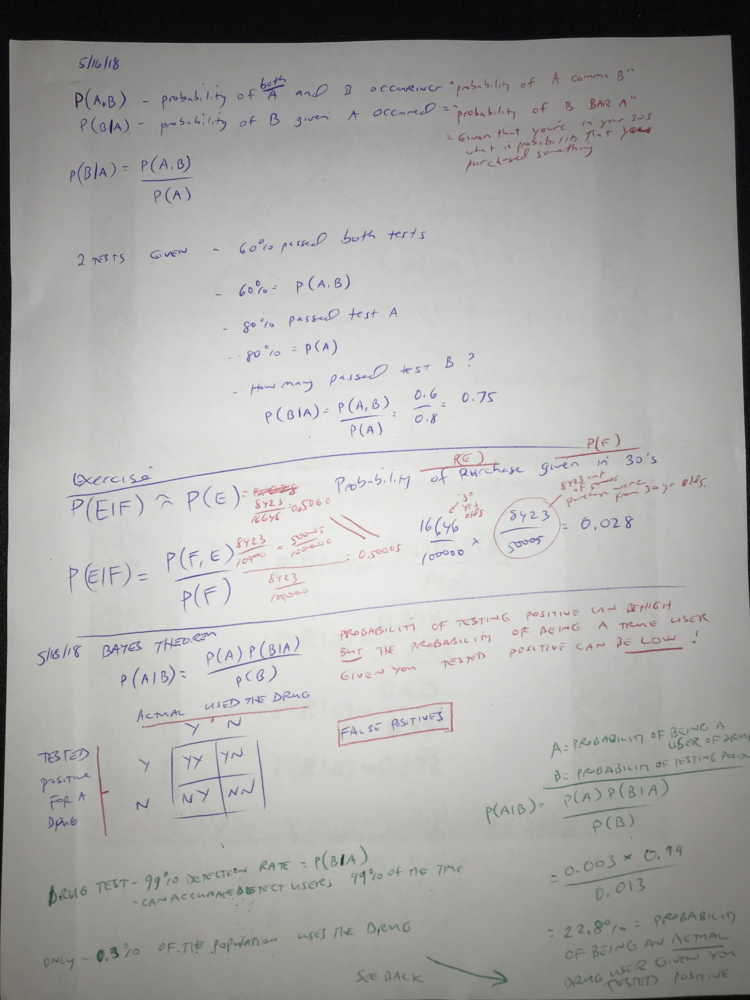

In [3]:
# Bayes Theorem Drug Test

# Frank Kane Section 2 Lecture 20

Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - Drug Test.jpeg''')



In [4]:
# Bayes Theorem Drug Test

# Other uses of Bayes Theorem:

#     If new evidence is presented (e.g. Probability that Sally has the flu if patient is a girl)

# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/OqmJhPQYRc8" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')


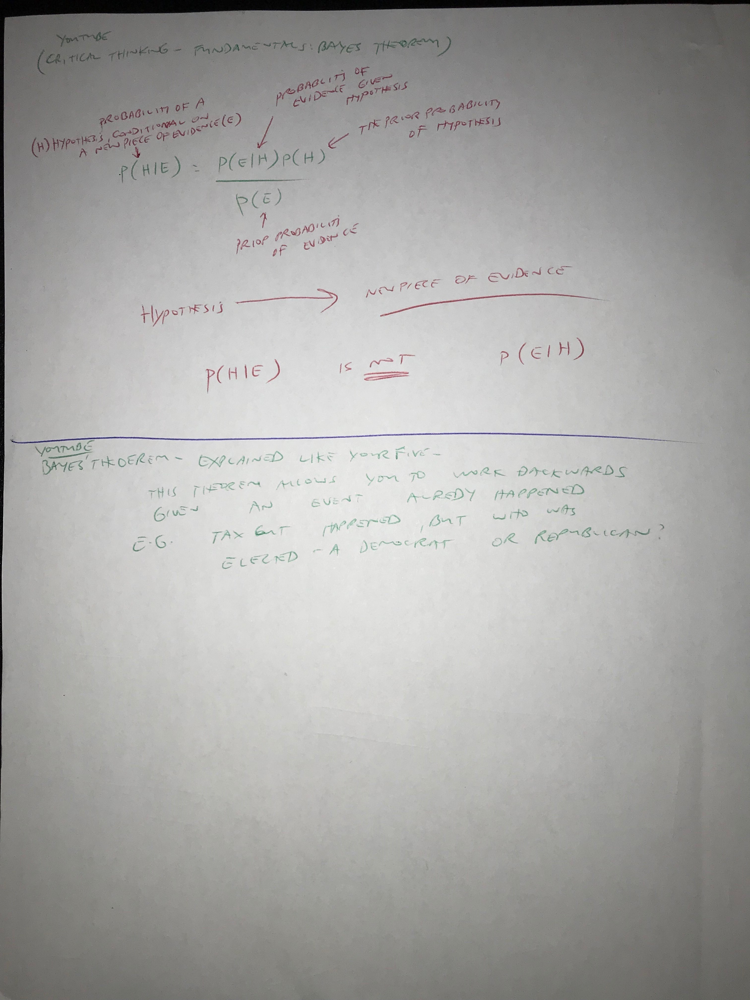

In [5]:
Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - New Evidence plus Work Backwards.jpeg''')

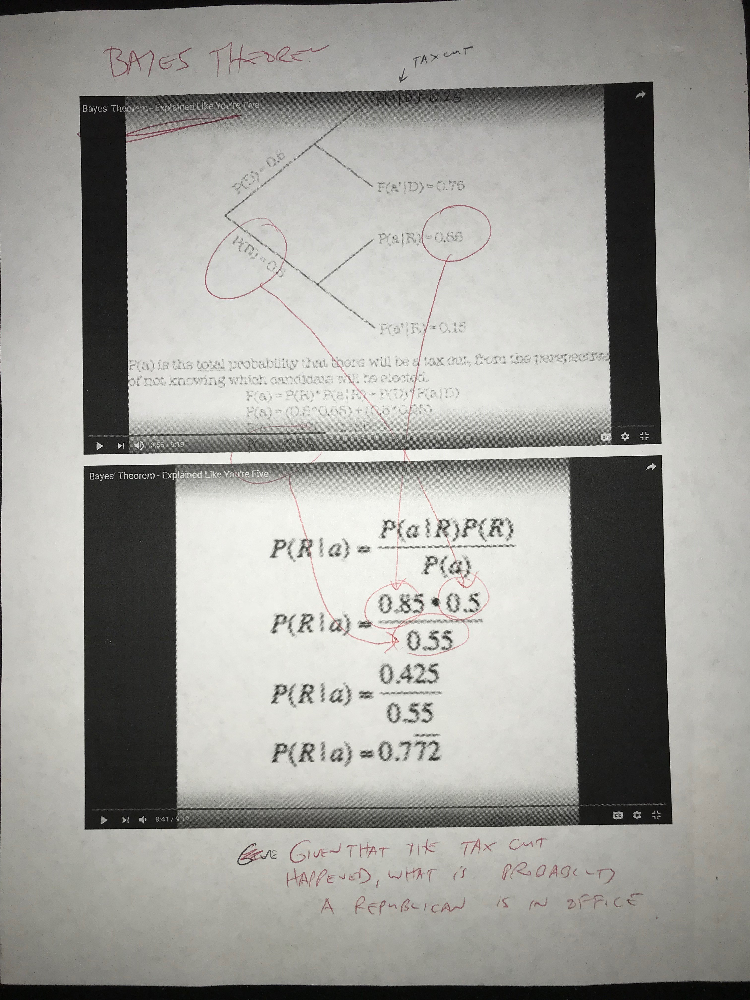

In [6]:
Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - Explained like youre Five.jpeg''')

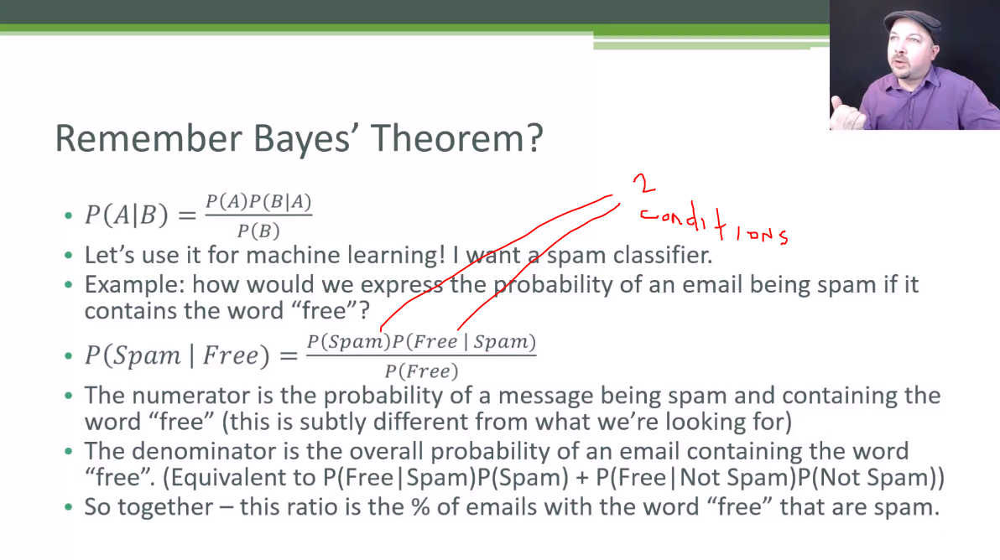

In [7]:
# Frank Kane Section 4 Lecture 27 Minutes: 0:28
Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - Spam Classifier.png''')


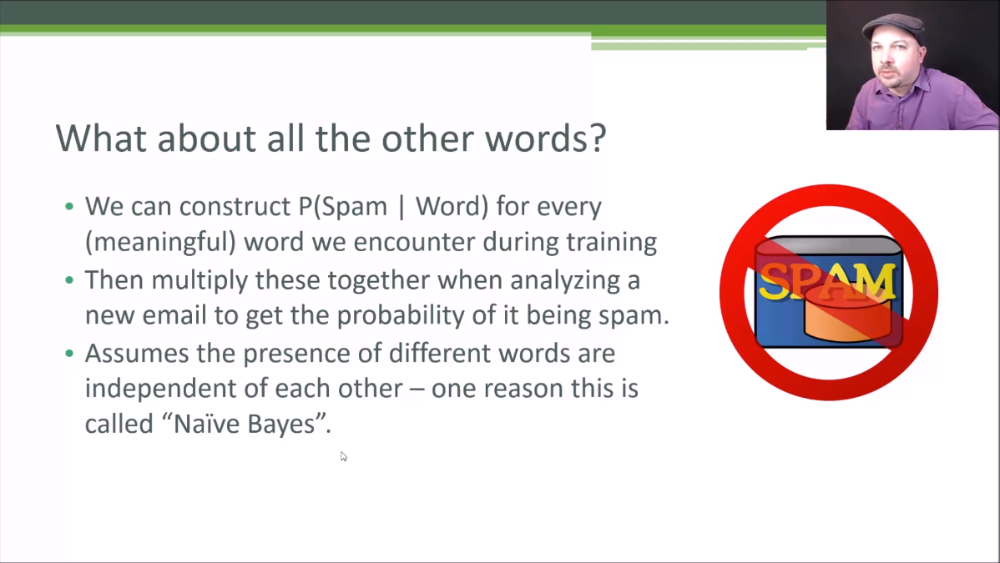

In [8]:
# Frank Kane Section 4 Lecture 27 Minutes: 2:12

# Dealing with "Multiple Conditions"

Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - Multiply Probabilities.png''')

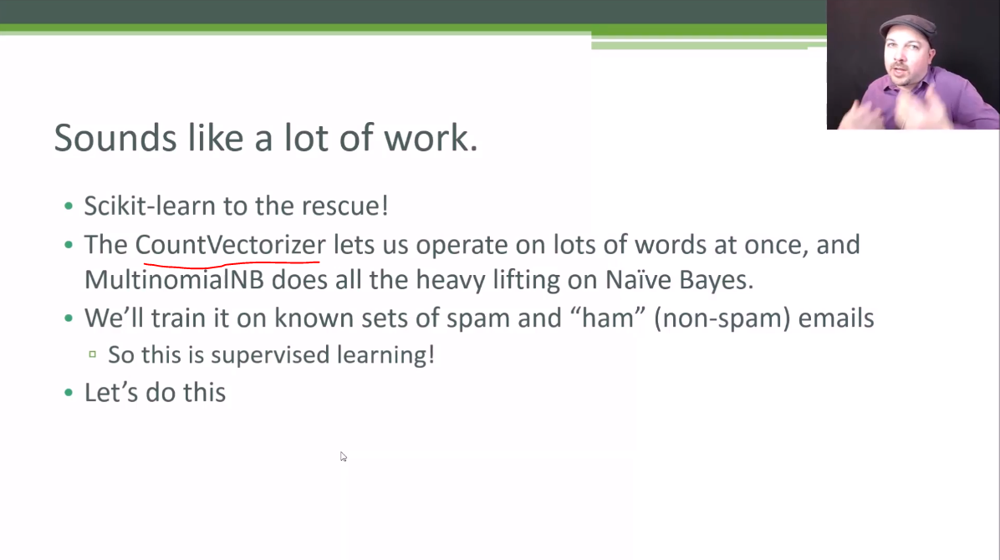

In [9]:
# Frank Kane Section 4 Lecture 27 Minutes: 3:24
Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - CountVectorizer.png''')

<font size="6"><span style="color:blue;font-weight:bold">Other Sources</span></font>

+ Scikit Learn Website: <a href="http://scikit-learn.org/stable/modules/tree.html">Link</a>
+ Imbalanced Data: <a href="https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/">Link</a>

What is Imbalanced Data?
Imbalanced data typically refers to a problem with classification problems where the classes are not represented equally.

For example, you may have a 2-class (binary) classification problem with 100 instances (rows). A total of 80 instances are labeled with Class-1 and the remaining 20 instances are labeled with Class-2.

<font size="6"><span style="color:blue;font-weight:bold">How to explain to a layperson</span></font>

In [10]:
#     Work backwards given an event has already happened (e.g. Tax Cut happened, but who was elected?  Republican or Democrat?)

# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/2Df1sDAyRvQ" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')


<font size="6"><span style="color:blue;font-weight:bold">Parameters, Attributes, and Methods</span></font>

+ Scikit Learn Website: Naive Bayes Overview: <a href="http://scikit-learn.org/stable/modules/naive_bayes.html#">Link</a>


+ Scikit Learn Website: Naive Bayes Gaussian NB: <a href="http://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html">Link</a>


+ Scikit Learn Website: Multinomial NB: <a href="http://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html">Link</a>



<font size="6"><span style="color:blue;font-weight:bold">Code Practice</span></font>

<font size="3"><span style="color:blue;font-weight:bold">Make Blobs Example</span></font>

In [11]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

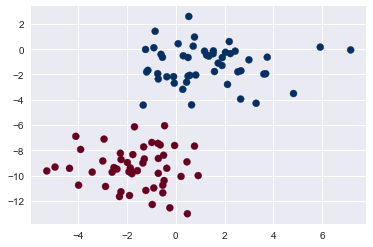

In [12]:
# (PDH p385)

from sklearn.datasets import make_blobs
X, y=make_blobs(100, 2, centers=2, random_state=2, cluster_std=1.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='RdBu')

In [13]:
from sklearn.naive_bayes import GaussianNB
model=GaussianNB()
model.fit(X, y);

rng=np.random.RandomState(0)
Xnew=[-6, -14]+[14,18]*rng.rand(2000,2)
ynew=model.predict(Xnew)

In [14]:
Xnew

array([[ 1.68338905, -1.12659141],
       [ 2.43868727, -4.19210271],
       [-0.06883281, -2.37390596],
       ..., 
       [-4.32134532, -7.70649139],
       [ 0.08823081,  0.94005305],
       [ 7.05928655, -8.44990818]])

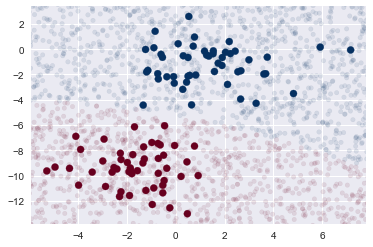

In [15]:
plt.scatter(X[:,0], X[:, 1], c=y, s=50, cmap='RdBu')
lim=plt.axis()
plt.scatter(Xnew[:, 0], Xnew[:, 1], c=ynew, s=20, cmap='RdBu', alpha=0.1)
plt.axis(lim);
plt.show()

# (PDH p385) - We see a slightly curved boundary in the classifications - in general, the boundary in the Gaussian naive Bayes
# is quadratic

In [16]:
# (PDH p385) A nice piece of this Bayesian formalism is that it naturally allows for probabilistic classification, which we can
# compute using predict_proba method:

yprob=model.predict_proba(Xnew)
yprob[-8:].round(2)

# (PDH p386) The columns give the posterior probabilities of the first and second label, respectively.  In other words, shows 
# you the probabilities of data point being red or blue.

array([[ 0.89,  0.11],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 0.  ,  1.  ],
       [ 0.15,  0.85]])

<font size="3"><span style="color:blue;font-weight:bold">News Groups Example</span></font>

In [17]:
# (PDH p386)

from sklearn.datasets import fetch_20newsgroups
data=fetch_20newsgroups()
data.target_names

# What is this dataset?  http://scikit-learn.org/stable/datasets/index.html#newsgroups-dataset
# The 20 newsgroups dataset comprises around 18000 newsgroups posts on 20 topics split in two subsets: 
# one for training (or development) and the other one for testing (or for performance evaluation). 
# The split between the train and test set is based upon a messages posted before and after a specific date.

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [18]:
categories=['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics']
train=fetch_20newsgroups(subset='train', categories=categories)
test=fetch_20newsgroups(subset='test', categories=categories)

In [19]:
print(train.data[5])

From: dmcgee@uluhe.soest.hawaii.edu (Don McGee)
Subject: Federal Hearing
Originator: dmcgee@uluhe
Organization: School of Ocean and Earth Science and Technology
Distribution: usa
Lines: 10


Fact or rumor....?  Madalyn Murray O'Hare an atheist who eliminated the
use of the bible reading and prayer in public schools 15 years ago is now
going to appear before the FCC with a petition to stop the reading of the
Gospel on the airways of America.  And she is also campaigning to remove
Christmas programs, songs, etc from the public schools.  If it is true
then mail to Federal Communications Commission 1919 H Street Washington DC
20054 expressing your opposition to her request.  Reference Petition number

2493.



In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline

model=make_pipeline(TfidfVectorizer(), MultinomialNB())

model.fit(train.data, train.target)
labels=model.predict(test.data)

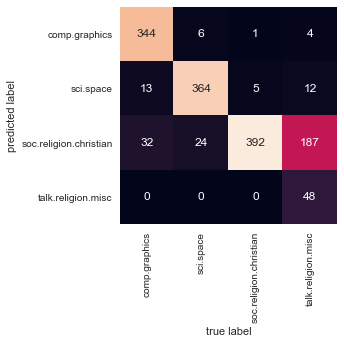

In [21]:
from sklearn.metrics import confusion_matrix
mat=confusion_matrix(test.target, labels)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
           xticklabels=train.target_names, yticklabels=train.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [22]:
# function to help predict a string

def predict_category(s, train=train, model=model):
    pred=model.predict([s])
    return train.target_names[pred[0]]

print(predict_category('sending a payload to ISS'))
print(predict_category('Christian computer screens'))

sci.space
soc.religion.christian


<font size="3"><span style="color:blue;font-weight:bold">Social Network Ads Example</span></font>

In [23]:
# https://www.youtube.com/watch?v=gPJljA6Beb8&t=187s 
# Social Network Ads - tells which of the users purchased/not purchased a particular product

dataset=pd.read_csv(r'''C:\GitHub Upload\Data Files\Social_Network_Ads.csv''')

dataset



,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,Male,19,19000,0
1,15810944,Male,35,20000,0
2,15668575,Female,26,43000,0
3,15603246,Female,27,57000,0
4,15804002,Male,19,76000,0
5,15728773,Male,27,58000,0
6,15598044,Female,27,84000,0
7,15694829,Female,32,150000,1
8,15600575,Male,25,33000,0
9,15727311,Female,35,65000,0


In [24]:
X=dataset.iloc[:, [2,3]].values
y=dataset.iloc[:, 4].values # The purchase variable (0 or 1)

# Splitting the dataset into the Training set and Test set
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.25, random_state=0)

# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

# Fitting classifier to the Training Set
from sklearn.naive_bayes import GaussianNB
classifier=GaussianNB()
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred=classifier.predict(X_test)

C:\Users\groldan\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
C:\Users\groldan\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\groldan\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\groldan\AppData\Lo

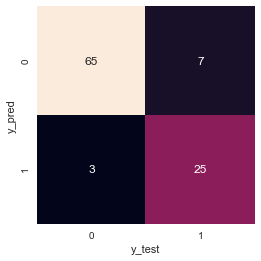

In [25]:
# Making the confusion Matrix

import seaborn as sns; sns.set()
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_test, y_pred)

sns.heatmap(cm.T, square=True, annot=True, fmt='d', cbar=False,
           xticklabels={0:'No', 1:'Yes'})

plt.xlabel('y_test')
plt.ylabel('y_pred');


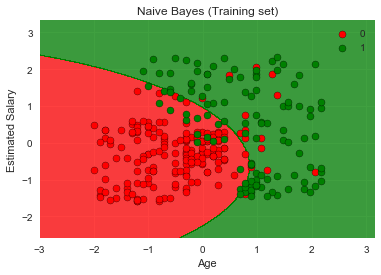

Basically, according to the fitted model, everything behind the curved line (the prediction boundary) is categorized
as "Did not purchase." Everything in front of the curved line is categorized as "Did purchase"
In SVM and Logistic Regression, the prediction boundaries may be straight lines
see # https://www.youtube.com/watch?v=gPJljA6Beb8&t=187s minute:6:45


In [26]:
# Code from Naive Bayes: https://www.superdatascience.com/machine-learning/

# Visualising the Training set results
from matplotlib.colors import ListedColormap
X_set, y_set = X_train, y_train
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green'))(i), label = j, edgecolors='black')

plt.title('Naive Bayes (Training set)')
plt.xlabel('Age')
plt.ylabel('Estimated Salary')
plt.legend()
# plt.figure(figsize=(100,100)) not working
plt.show()

HTML('<font size="3"><span style="color:red;font-weight:bold">Prediction Boundaries</span></font>')
print('Basically, according to the fitted model, everything behind the curved line (the prediction boundary) is categorized')
print('as "Did not purchase." Everything in front of the curved line is categorized as "Did purchase"')
print('In SVM and Logistic Regression, the prediction boundaries may be straight lines')
print('see # https://www.youtube.com/watch?v=gPJljA6Beb8&t=187s minute:6:45')



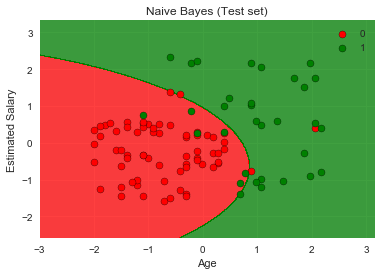

In [27]:

# Visualising the Test set results
from matplotlib.colors import ListedColormap
X_set, y_set = X_test, y_test
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green'))(i), label = j, edgecolors='black')
plt.title('Naive Bayes (Test set)')
plt.xlabel('Age')
plt.ylabel('Estimated Salary')
plt.legend()
plt.show()

<font size="6"><span style="color:blue;font-weight:bold">Mental Health Project</span></font>

In [28]:
# Data Source: https://www.kaggle.com/osmi/mental-health-in-tech-survey
# Dataset Information
# This dataset is from a 2014 survey that measures attitudes towards mental health and frequency of mental health 
# disorders in the tech workplace. 

import pandas as pd

# For initial analysis I removed variables with many NaN
data=pd.read_excel(r'''C:\GitHub Upload\Mental Health in Tech - 0 - Raw Data.xlsx''',  
                   sheetname='Mental Health Data', 
                  usecols=['family_history', 'treatment', 'work_interfere (Yes/No)', 
                         'benefits', 'care_options', 'seek_help', 'mental_health_consequence',
                          'coworkers', 'supervisor'])

data.head()

# Goal is to create a model that helps predict treatment variable: 
# treatment: Have you sought treatment for a mental health condition?


,family_history,treatment,work_interfere (Yes/No),benefits,care_options,seek_help,mental_health_consequence,coworkers,supervisor
0,No,Yes,Yes,Yes,Not sure,Yes,No,Some of them,Yes
1,No,No,No,No,No,No,No,Yes,Yes
2,Yes,Yes,Yes,No,Yes,No,Yes,Some of them,No
3,No,No,No,Don't know,No,Don't know,Maybe,No,No
4,No,No,No,Yes,No,Don't know,No,Some of them,Yes


+ Timestamp	
    + Timestamp <br><br>
+ Age
    + Age <br><br>
+ Gender
    + Gender <br><br>
+ Country
    + Country <br><br>
+ state	
    + If you live in the United States, which state or territory do you live in? <br><br>
+ self_employed	
    + Are you self-employed? <br><br>
+ family_history	
    + Do you have a family history of mental illness? <br><br>
+ treatment	
    + Have you sought treatment for a mental health condition? <br><br>
+ work_interfere	
    + If you have a mental health condition, do you feel that it interferes with your work? <br><br>
+ no_employees	
    + How many employees does your company or organization have? <br><br>
+ remote_work	
    + Do you work remotely (outside of an office) at least 50% of the time? <br><br>
+ tech_company	
    + Is your employer primarily a tech company/organization? <br><br>
+ benefits	
    + Does your employer provide mental health benefits? <br><br>
+ care_options	
    + Do you know the options for mental health care your employer provides? <br><br>
+ wellness_program	
    + Has your employer ever discussed mental health as part of an employee wellness program? <br><br>
+ seek_help	
    + Does your employer provide resources to learn more about mental health issues and how to seek help? <br><br>
+ anonymity	
    + Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources? <br><br>
+ leave	
    + How easy is it for you to take medical leave for a mental health condition? <br><br>
+ mental_health_consequence	
    + Do you think that discussing a mental health issue with your employer would have negative + consequences? <br><br>
+ phys_health_consequence	
    + Do you think that discussing a physical health issue with your employer would have negative + consequences? <br><br>
+ coworkers	
    + Would you be willing to discuss a mental health issue with your coworkers? <br><br>
+ supervisor	
    + Would you be willing to discuss a mental health issue with your direct supervisor(s)? <br><br>
+ mental_health_interview	
    + Would you bring up a mental health issue with a potential employer in an interview? <br><br>
+ phys_health_interview	
    + Would you bring up a physical health issue with a potential employer in an interview? <br><br>
+ mental_vs_physical	
    + Do you feel that your employer takes mental health as seriously as physical health? <br><br>
+ obs_consequence	
    + Have you heard of or observed negative consequences for coworkers with mental health conditions in your workplace? <br><br>
+ comments	
    + Any additional notes or comments <br><br>


Can I use Naive Bayes to calculate the probability that a person will seek treatment?  Yes

Maybe I can look at it from this point of view:

What is the probability that someone sought treatment for a mental health condition given that he/she felt their mental health condition interfered with their work?

vs.

What is the probability that someone felt their mental health condition interfered with their work given that they sought treatment for their mental health condition.

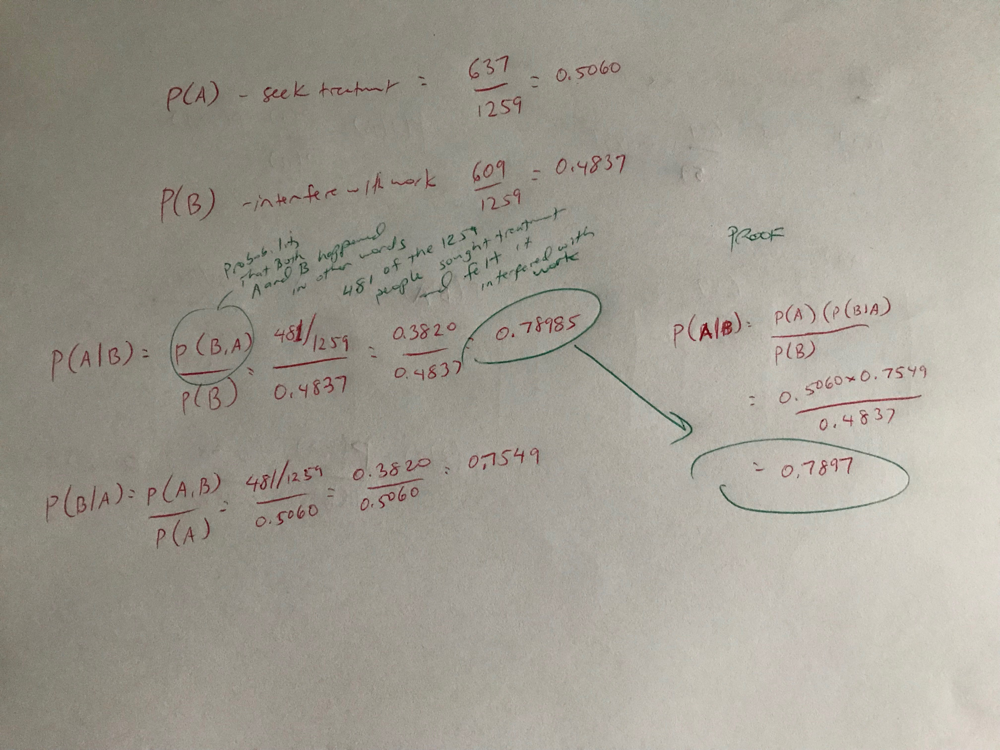

In [29]:
# Mental Health Proof

Image(filename=r'''C:\GitHub Upload\Images\Bayes Theorem - My Proof Mental Health.jpeg''')

In [30]:
from numpy import *
import datetime

# data.fillna(9, inplace=True) # Replace blanks with 9
data.replace('Yes', 1.0, inplace=True)
data.replace('No', 0.0, inplace=True)

data

,family_history,treatment,work_interfere (Yes/No),benefits,care_options,seek_help,mental_health_consequence,coworkers,supervisor
0,0.0,1.0,1.0,1,Not sure,1,0,Some of them,1
1,0.0,0.0,0.0,0,0,0,0,1,1
2,1.0,1.0,1.0,0,1,0,1,Some of them,0
3,0.0,0.0,0.0,Don't know,0,Don't know,Maybe,0,0
4,0.0,0.0,0.0,1,0,Don't know,0,Some of them,1
5,1.0,1.0,1.0,0,0,0,Maybe,Some of them,0
6,1.0,0.0,1.0,1,Not sure,Don't know,0,1,1
7,0.0,0.0,0.0,0,1,0,0,0,0
8,0.0,1.0,1.0,Don't know,0,0,0,Some of them,1
9,1.0,1.0,1.0,1,1,0,Maybe,1,1


In [31]:
c={'Male': 0.0, 'Female': 1.0}

# decided to make "Don't know" and "Not sure" NaN
# decided to make "Some of them" a 1.  Pertains to "Are you willing to discuss a mental health issues with your coworkers / supervisor?
d={0:0.0, 1: 1.0, "Don't know": NaN, 'Maybe': NaN, 'Some of them': 1.0, 'Not sure': NaN}

# for work_interfere
e={'Never':0.0, 'Rarely':1.0, 'Sometimes':2.0, 'Often':3.0}

# for how easy is it for you to take medical leave?
f={"Don't know": NaN, 'Very difficult': 0.0, 'Somewhat difficult': 1.0, 'Somewhat easy': 2.0, 'Very easy':3.0}

# number of employees
g={'26-100':0.0, '100-500':1.0, '500-1000':2.0, 'More than 1000':3.0}

# decided to make "Maybe" a 1 for the to questions below
# Would you bring up a mental health issue with a potential employer in an interview?
# Would you bring up a physical health issue with a potential employer in an interview?
h={0:0.0, 1: 1.0, 'Maybe': 1.0}


# data['Gender Cleaned']=data['Gender Cleaned'].map(c)
# data['self_employed']=data['self_employed'].map(d)
data['family_history']=data['family_history'].map(d)
data['treatment']=data['treatment'].map(d)
# data['work_interfere']=data['work_interfere'].map(e)
data['work_interfere (Yes/No)']=data['work_interfere (Yes/No)'].map(d)
# data['no_employees']=data['no_employees'].map(g)
# data['remote_work']=data['remote_work'].map(d)
# data['tech_company']=data['tech_company'].map(d)
data['benefits']=data['benefits'].map(d)
data['care_options']=data['care_options'].map(d)
# data['wellness_program']=data['wellness_program'].map(d)
data['seek_help']=data['seek_help'].map(d)
# data['anonymity']=data['anonymity'].map(d)
data['mental_health_consequence']=data['mental_health_consequence'].map(d)
# data['phys_health_consequence']=data['phys_health_consequence'].map(d)
data['coworkers']=data['coworkers'].map(d)
data['supervisor']=data['supervisor'].map(d)
# data['leave']=data['leave'].map(f)
# data['mental_health_interview']=data['mental_health_interview'].map(h)
# data['phys_health_interview']=data['phys_health_interview'].map(h)
# data['mental_vs_physical']=data['mental_vs_physical'].map(d)
# data['obs_consequence']=data['obs_consequence'].map(d)

data

,family_history,treatment,work_interfere (Yes/No),benefits,care_options,seek_help,mental_health_consequence,coworkers,supervisor
0,0.0,1.0,1.0,1.0,NaN,1.0,0.0,1.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
3,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,NaN,0.0,1.0,1.0
5,1.0,1.0,1.0,0.0,0.0,0.0,NaN,1.0,0.0
6,1.0,0.0,1.0,1.0,NaN,NaN,0.0,1.0,1.0
7,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8,0.0,1.0,1.0,NaN,0.0,0.0,0.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,0.0,NaN,1.0,1.0


In [32]:
data.describe()

,family_history,treatment,work_interfere (Yes/No),benefits,care_options,seek_help,mental_health_consequence,coworkers,supervisor
count,1259.000000,1259.000000,1259.000000,851.000000,945.000000,896.000000,782.000000,1259.000000,1259.000000
mean,0.390786,0.505957,0.483717,0.560517,0.469841,0.279018,0.373402,0.793487,0.687847
std,0.488121,0.500163,0.499933,0.496616,0.499354,0.448767,0.484017,0.404964,0.463556
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [33]:
data=data.dropna()

data.describe()

,family_history,treatment,work_interfere (Yes/No),benefits,care_options,seek_help,mental_health_consequence,coworkers,supervisor
count,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000
mean,0.394089,0.541872,0.514778,0.453202,0.605911,0.322660,0.426108,0.753695,0.674877
std,0.489257,0.498858,0.500398,0.498419,0.489257,0.468071,0.495120,0.431390,0.468999
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [34]:
X=data.iloc[:, [0, 2, 3, 4, 5, 6, 7, 8]].values
y=data.iloc[:, 1].values # The treatment variable (0 or 1)

# Splitting the dataset into the Training set and Test set
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.25, random_state=0)

# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

# Fitting classifier to the Training Set
from sklearn.naive_bayes import GaussianNB
classifier=GaussianNB()
classifier=classifier.fit(X_train, y_train)

# Predicting the Train set results
y_pred_train=classifier.predict(X_train)

# Predicting the Test set results
y_pred_test=classifier.predict(X_test)

In [35]:
y_train.size

304

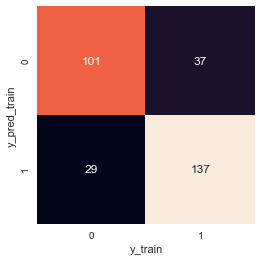

In [36]:
# Making the confusion Matrix

import seaborn as sns; sns.set()
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_train, y_pred_train)

sns.heatmap(cm.T, square=True, annot=True, fmt='d', cbar=False,
           xticklabels={0:'No', 1:'Yes'})

plt.xlabel('y_train')
plt.ylabel('y_pred_train');

In [37]:
Accuracy=(101+137)/(101+137+29+37)
Accuracy

0.7828947368421053

### <span style="color:blue">What is K-Fold (cross_val_score)?</span> 

+ (Frank Kane Section 7 Lecture 51) K-Fold Cross Validation splits the data into K randomly assigned segments and one segment is reserved as the test data.  For example if K=10 (or cv=10), there are 9 training segments and 1 testing segment.  Train on each of the K-1 segments and measure their performance against the test set.  Take the average of the K-1 r-squared scores.<br><br>
+ <a href="http://scikit-learn.org/stable/modules/cross_validation.html#cross-validation"><b><span style="color:blue">Scikit cross_val_score: Documentation</span></b></a>
    + Documentation shows different ways of splitting the data for different cross validation strategies
        + KFold - divides all the samples in  groups of samples, called folds
            + <font size="3"><span style="color:red;font-weight:bold">In the basic approach, called k-fold CV, the training set is split into k smaller sets.  For each of the k folds a model is trained using k-1 (k minus 1) of the folds as the training data.  The resulting model is validated on the remaining part of the data (i.e. it is used as a test to compute a performance measure such as accuracy.  The performance measure reported by k-fold cross-validation is then the average of the values computed in the loop</span></font>
        + RepeatedKFold - repeats K-Fold n times
        + LeaveOneOut - (or LOO) is a simple cross-validation. Each learning set is created by taking all the samples except one, the test set being the sample left out. 
        + ShuffleSplit - will generate a user defined number of independent train / test dataset splits. Samples are first shuffled and then split into a pair of train and test sets.
        + StratifiedKFold - is a variation of k-fold which returns stratified folds: each set contains approximately the same percentage of samples of each target class as the complete set.

    + <a href="C:\\Users\\groldan"><img src="Images/Kfold Cross Validation.png" style="transform:rotate(0deg); width: 950px;" align="left"  ></a><br><br>
+ <a href="http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html"><b><span style="color:blue">Scikit cross_val_score: Parameters</span></b></a>
    + See also:
        + sklearn.model_selection.cross_validate
            + To run cross-validation on multiple metrics and also to return train scores, fit times and score times.
        + sklearn.model_selection.cross_val_predict
            + Get predictions from each split of cross-validation for diagnostic purposes.
        + sklearn.metrics.make_scorer
            + Make a scorer from a performance metric or loss function.

In [38]:
#  K-Fold

# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/TIgfjmp-4BA" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')


In [39]:
#  K-Fold

# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/6dbrR-WymjI" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')

# Use the Average Testing Accuracy as the estimate of out-of-sample accuracy

In [40]:


from sklearn.model_selection import cross_val_score
from sklearn import svm

# When using cross_val_score, use the entire data set not a defined training set because it will subset the entire data set into 
# multiple training sets

X_norm=sc.fit_transform(X)

classifier=GaussianNB()

scores=cross_val_score(classifier, X_norm, y, cv=10)

print(scores)

print('\n')

print(scores.mean())

[ 0.75609756  0.80487805  0.80487805  0.80487805  0.82926829  0.80487805
  0.625       0.85        0.775       0.725     ]


0.777987804878


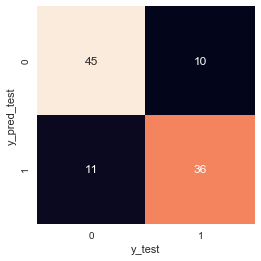

In [41]:
# Making the confusion Matrix

cm_2=confusion_matrix(y_test, y_pred_test)

sns.heatmap(cm_2.T, square=True, annot=True, fmt='d', cbar=False,
           xticklabels={0:'No', 1:'Yes'})

plt.xlabel('y_test')
plt.ylabel('y_pred_test');

In [42]:
Accuracy=(45+36)/(45+36+11+10)
Accuracy

0.7941176470588235